# YOLOv8s Experiment Analysis — CCTSDB2021
**Full analysis notebook**: metrics comparison, training curves, PR curves, detection visualization, GradCAM, and error analysis across baseline + variants.

**Expected folder structure:**
```
runs/
  detect/
    baseline/          ← Ultralytics run folder
      weights/best.pt
      results.csv
      args.yaml
    variant_spd/
    variant_bифpn/
    ...
dataset/
  images/val/          ← CCTSDB2021 val images
  labels/val/          ← YOLO-format .txt labels
  data.yaml
```

## 0. Setup & Configuration

In [5]:
# ── Install dependencies ────────────────────────────────────────────────────
# Run once; comment out after first execution
# !pip install ultralytics grad-cam seaborn scikit-learn matplotlib pandas
# !pip install torch torchvision --index-url https://download.pytorch.org/whl/cu118

import os
import glob
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from pathlib import Path
from PIL import Image
import cv2
import torch
import yaml
from ultralytics import YOLO
from sklearn.metrics import confusion_matrix

warnings.filterwarnings('ignore')
sns.set_theme(style='whitegrid', font_scale=1.1)

print(f"PyTorch  : {torch.__version__}")
print(f"CUDA     : {torch.cuda.is_available()}")
print(f"Device   : {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU'}")

PyTorch  : 2.12.0+cu130
CUDA     : True
Device   : NVIDIA GeForce RTX 3060


In [6]:
# ── USER CONFIGURATION — edit these paths ──────────────────────────────────
dataset_path = "D:/deep-learning/datasets/cctsdb2021-full"
project_name = "YOLOV8s Traffic Detection"

RESULT_PATH = Path("./results")
RUNS_DIR   = Path(f'../runs/detect/{project_name}')          # parent folder containing all run sub-folders
DATA_YAML  = Path(f'{dataset_path}/dataset.yaml')    # CCTSDB2021 data.yaml
VAL_IMG_DIR = Path(f'{dataset_path}/images/test') # validation images
VAL_LBL_DIR = Path(f'{dataset_path}/labels/test') # YOLO .txt labels for val set
DEVICE     = 'cuda:0'                    # 'cpu' if no GPU available
IMGSZ      = 640
CONF_THRES = 0.25
IOU_THRES  = 0.45

# Map run folder names → display names for plots
# Edit to match YOUR actual folder names inside RUNS_DIR
# EXPERIMENTS = {
#     'baseline'     : 'YOLOv8s',
# }
# Auto-discover if you want (uncomment to use instead of manual dict above):
EXPERIMENTS = {p.name: p.name for p in sorted(RUNS_DIR.iterdir()) if p.is_dir()}
PALETTE = sns.color_palette('tab10', n_colors=len(EXPERIMENTS))
print(EXPERIMENTS)
# CCTSDB2021 class names (adjust if your data.yaml differs)
with open(DATA_YAML) as f:
    data_cfg = yaml.safe_load(f)
CLASS_NAMES = data_cfg.get('names', [])
NC = len(CLASS_NAMES)
print(f"Classes ({NC}): {CLASS_NAMES}")

{'CSW-YOLO': 'CSW-YOLO', 'ES-YOLO': 'ES-YOLO', 'YOLOv8s': 'YOLOv8s', 'YOLOv8s + Bi-FPN': 'YOLOv8s + Bi-FPN', 'YOLOv8s + CBAM': 'YOLOv8s + CBAM', 'YOLOv8s + DySample + P2': 'YOLOv8s + DySample + P2', 'YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU': 'YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU', 'YOLOv8s + P2': 'YOLOv8s + P2', 'YOLOv8s + P2 + Bi-FPN + Dysample': 'YOLOv8s + P2 + Bi-FPN + Dysample', 'YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU': 'YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU', 'YOLOv8s + P2 v2': 'YOLOv8s + P2 v2', 'YOLOv8s + SPConv': 'YOLOv8s + SPConv', 'YOLOv8s + SPConvMulti': 'YOLOv8s + SPConvMulti', 'YOLOv8s + SPConvMulti + C2f-EMA': 'YOLOv8s + SPConvMulti + C2f-EMA', 'YOLOv8s + SPConvMulti + P2': 'YOLOv8s + SPConvMulti + P2', 'YOLOv8s + Weighted Concat': 'YOLOv8s + Weighted Concat', 'YOLOv8s + Weighted Concat + Dysample': 'YOLOv8s + Weighted Concat + Dysample', 'YOLOv8s + WIoU': 'YOLOv8s + WIoU', 'YOLOv8s + Wise-Inner-MPDIoU': 'YOLOv8s + Wise-Inner-MPDI

## 1. Training Curves

In [7]:
def load_results_csv(run_name):
    """Load Ultralytics results.csv; strip whitespace from column names."""
    csv_path = RUNS_DIR / run_name / 'train' / 'results.csv'
    if not csv_path.exists():
        print(f"  [warn] Missing: {csv_path}")
        return None
    df = pd.read_csv(csv_path)
    df.columns = df.columns.str.strip()
    return df

results = {}
for run, label in EXPERIMENTS.items():
    df = load_results_csv(run)
    if df is not None:
        results[label] = df
        print(f"  Loaded: {run} ({len(df)} epochs)")

# ── Column mapping (Ultralytics naming can vary by version) ─────────────────
COL = {
    'epoch'     : 'epoch',
    'box_loss'  : 'train/box_loss',
    'cls_loss'  : 'train/cls_loss',
    'dfl_loss'  : 'train/dfl_loss',
    'val_box'   : 'val/box_loss',
    'val_cls'   : 'val/cls_loss',
    'map50'     : 'metrics/mAP50(B)',
    'map5095'   : 'metrics/mAP50-95(B)',
    'precision' : 'metrics/precision(B)',
    'recall'    : 'metrics/recall(B)',
}
# Verify columns exist in first result
first_df = next(iter(results.values()))
for key, col in COL.items():
    if col not in first_df.columns:
        print(f"  [warn] Column not found: '{col}' (check your Ultralytics version)")

  Loaded: CSW-YOLO (100 epochs)
  Loaded: ES-YOLO (58 epochs)
  Loaded: YOLOv8s (100 epochs)
  Loaded: YOLOv8s + Bi-FPN (100 epochs)
  Loaded: YOLOv8s + CBAM (100 epochs)
  Loaded: YOLOv8s + DySample + P2 (80 epochs)
  Loaded: YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU (100 epochs)
  Loaded: YOLOv8s + P2 (80 epochs)
  Loaded: YOLOv8s + P2 + Bi-FPN + Dysample (61 epochs)
  Loaded: YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU (85 epochs)
  Loaded: YOLOv8s + P2 v2 (63 epochs)
  Loaded: YOLOv8s + SPConv (100 epochs)
  Loaded: YOLOv8s + SPConvMulti (100 epochs)
  Loaded: YOLOv8s + SPConvMulti + C2f-EMA (100 epochs)
  Loaded: YOLOv8s + SPConvMulti + P2 (94 epochs)
  Loaded: YOLOv8s + Weighted Concat (100 epochs)
  Loaded: YOLOv8s + Weighted Concat + Dysample (100 epochs)
  Loaded: YOLOv8s + WIoU (100 epochs)
  Loaded: YOLOv8s + Wise-Inner-MPDIoU (100 epochs)
  Loaded: YOLOv8s Unscaled Bottlenecks (100 epochs)


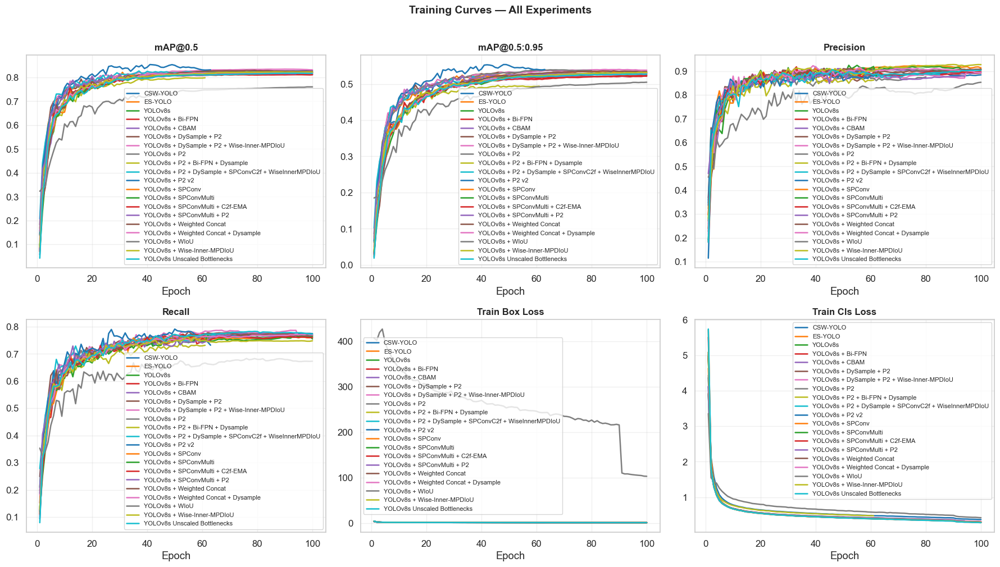

In [8]:
def plot_training_curves(results, metrics, titles, ncols=3, figsize=(18, 5)):
    nrows = (len(metrics) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(figsize[0], figsize[1] * nrows))
    axes = np.array(axes).flatten()
    for ax, (col_key, title) in zip(axes, zip(metrics, titles)):
        for i, (label, df) in enumerate(results.items()):
            col = COL.get(col_key, col_key)
            if col in df.columns:
                ax.plot(df[COL['epoch']], df[col], label=label,
                        color=PALETTE[i], linewidth=1.8)
        ax.set_title(title, fontweight='bold', fontsize=12)
        ax.set_xlabel('Epoch')
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
    for ax in axes[len(metrics):]:
        ax.set_visible(False)
    plt.suptitle('Training Curves — All Experiments', fontsize=14, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.savefig(f'{RESULT_PATH}/analysis_training_curves.png', dpi=150, bbox_inches='tight')
    plt.show()

train_metrics = ['map50', 'map5095', 'precision', 'recall', 'box_loss', 'cls_loss']
train_titles  = ['mAP@0.5', 'mAP@0.5:0.95', 'Precision', 'Recall',
                 'Train Box Loss', 'Train Cls Loss']
plot_training_curves(results, train_metrics, train_titles)

## 2. Final Metrics Comparison Table

In [ ]:
def get_best_epoch_metrics(df):
    """Return the row with the highest mAP@0.5."""
    col = COL['map50']
    if col not in df.columns:
        return df.iloc[-1]
    return df.loc[df[col].idxmax()]

summary_rows = []
for label, df in results.items():
    best = get_best_epoch_metrics(df)
    row = {'Model': label}
    for key in ['map50', 'map5095', 'precision', 'recall']:
        col = COL.get(key)
        row[key] = round(float(best[col]), 4) if col in best.index else None
    row['best_epoch'] = int(best[COL['epoch']])
    summary_rows.append(row)

summary_df = pd.DataFrame(summary_rows).set_index('Model')
summary_df.columns = ['mAP@0.5', 'mAP@0.5:0.95', 'Precision', 'Recall', 'Best Epoch']
summary_df.sort_values(by="mAp@0.5")

# Highlight best value per column
styled = (summary_df.style
    .highlight_max(subset=['mAP@0.5','mAP@0.5:0.95','Precision','Recall'],
                   color='#d4edda', axis=0)
    .format({'mAP@0.5': '{:.4f}', 'mAP@0.5:0.95': '{:.4f}',
             'Precision': '{:.4f}', 'Recall': '{:.4f}', 'Best Epoch': '{:.0f}'})
    .set_caption('Best validation metrics per model (green = highest)')
    .set_table_styles([{'selector': 'caption',
                        'props': [('font-size','13px'),('font-weight','bold')]}]))

print(summary_df.to_string())
styled

                                                       mAP@0.5  mAP@0.5:0.95  Precision  Recall  Best Epoch
Model                                                                                                      
CSW-YOLO                                                0.8276        0.5316     0.8834  0.7751          99
ES-YOLO                                                 0.8211        0.5220     0.8831  0.7271          31
YOLOv8s                                                 0.8212        0.5270     0.9007  0.7619          96
YOLOv8s + Bi-FPN                                        0.8148        0.5208     0.8913  0.7692          95
YOLOv8s + CBAM                                          0.8146        0.5219     0.8932  0.7650          91
YOLOv8s + DySample + P2                                 0.8231        0.5375     0.8858  0.7709          65
YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU             0.8343        0.5400     0.8740  0.7831          90
YOLOv8s + P2                

,mAP@0.5,mAP@0.5:0.95,Precision,Recall,Best Epoch
Model,,,,,
CSW-YOLO,0.8276,0.5316,0.8834,0.7751,99
ES-YOLO,0.8211,0.5220,0.8831,0.7271,31
YOLOv8s,0.8212,0.5270,0.9007,0.7619,96
YOLOv8s + Bi-FPN,0.8148,0.5208,0.8913,0.7692,95
YOLOv8s + CBAM,0.8146,0.5219,0.8932,0.7650,91
YOLOv8s + DySample + P2,0.8231,0.5375,0.8858,0.7709,65
YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU,0.8343,0.5400,0.8740,0.7831,90
YOLOv8s + P2,0.8226,0.5384,0.8629,0.7793,71
YOLOv8s + P2 + Bi-FPN + Dysample,0.7987,0.4938,0.8691,0.7288,54


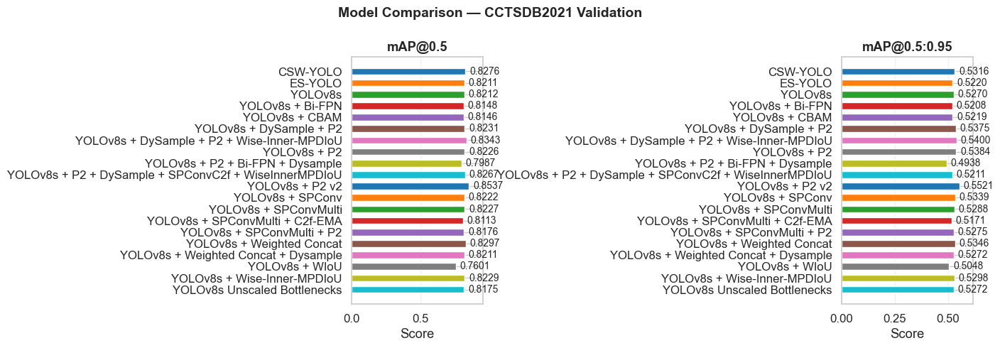

In [10]:
# Bar chart comparison
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
metrics_to_plot = [('mAP@0.5', 'mAP@0.5'), ('mAP@0.5:0.95', 'mAP@0.5:0.95')]

for ax, (col, title) in zip(axes, metrics_to_plot):
    vals = summary_df[col].dropna()
    bars = ax.barh(vals.index, vals.values,
                   color=[PALETTE[i] for i in range(len(vals))],
                   edgecolor='white', height=0.6)
    ax.bar_label(bars, fmt='%.4f', padding=4, fontsize=10)
    ax.set_xlim(0, vals.max() * 1.12)
    ax.set_title(title, fontweight='bold')
    ax.set_xlabel('Score')
    ax.grid(axis='x', alpha=0.3)
    ax.invert_yaxis()

plt.suptitle('Model Comparison — CCTSDB2021 Validation', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{RESULT_PATH}/analysis_model_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

## 3. Model Complexity: Params & FLOPs

In [11]:
from ultralytics.utils.torch_utils import model_info

complexity = {}
for run, label in EXPERIMENTS.items():
    # print(label)
    wt = RUNS_DIR / run / 'train' / 'weights' / 'best.pt'
    if not wt.exists():
        print(f"  [skip] No weights: {wt}")
        continue
    model = YOLO(str(wt))
    # model_info returns (layers, params, grads, flops)
    info = model_info(model.model, imgsz=IMGSZ, verbose=True)
    complexity[label] = {
        'Params (M)': round(info[1] / 1e6, 2),
        'FLOPs (G)' : round(info[3], 1),
    }
    print(f"  {label:30s}  Params: {complexity[label]['Params (M)']} M  "
          f"FLOPs: {complexity[label]['FLOPs (G)']} G")

complex_df = pd.DataFrame(complexity).T
complex_df

YOLOv8s-csw summary: 193 layers, 8,698,892 parameters, 0 gradients, 29.7 GFLOPs
  CSW-YOLO                        Params: 8.7 M  FLOPs: 29.7 G
es-YOLO summary: 204 layers, 8,645,695 parameters, 0 gradients, 41.5 GFLOPs
  ES-YOLO                         Params: 8.65 M  FLOPs: 41.5 G
YOLOv8s summary: 130 layers, 11,136,761 parameters, 0 gradients, 28.7 GFLOPs
  YOLOv8s                         Params: 11.14 M  FLOPs: 28.7 G
YOLOv8s-bi_fpn summary: 136 layers, 7,184,898 parameters, 0 gradients, 22.8 GFLOPs
  YOLOv8s + Bi-FPN                Params: 7.18 M  FLOPs: 22.8 G
YOLOv8s-cbam summary: 135 layers, 11,399,515 parameters, 0 gradients, 28.9 GFLOPs
  YOLOv8s + CBAM                  Params: 11.4 M  FLOPs: 28.9 G
YOLOv8-p2_dysample summary: 120 layers, 3,319,801 parameters, 0 gradients, 30.1 GFLOPs
  YOLOv8s + DySample + P2         Params: 3.32 M  FLOPs: 30.1 G
YOLOv8s-p2_dysample summary: 120 layers, 3,319,801 parameters, 0 gradients, 30.1 GFLOPs
  YOLOv8s + DySample + P2 + Wise-Inner-MPDI

,Params (M),FLOPs (G)
CSW-YOLO,8.70,29.7
ES-YOLO,8.65,41.5
YOLOv8s,11.14,28.7
YOLOv8s + Bi-FPN,7.18,22.8
YOLOv8s + CBAM,11.40,28.9
YOLOv8s + DySample + P2,3.32,30.1
YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU,3.32,30.1
YOLOv8s + P2,7.41,34.4
YOLOv8s + P2 + Bi-FPN + Dysample,2.25,23.8
YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU,3.32,30.1


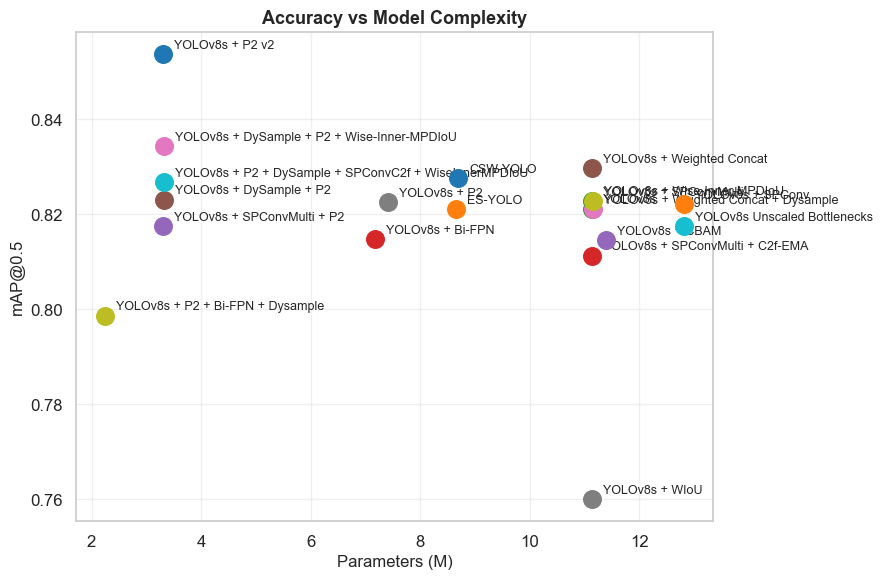

In [12]:
# Accuracy–complexity scatter
fig, ax = plt.subplots(figsize=(9, 6))
for i, label in enumerate(complex_df.index):
    if label not in summary_df.index:
        continue
    x = complex_df.loc[label, 'Params (M)']
    y = summary_df.loc[label, 'mAP@0.5']
    ax.scatter(x, y, s=160, color=PALETTE[i], zorder=5)
    ax.annotate(label, (x, y), textcoords='offset points',
                xytext=(8, 4), fontsize=9)

ax.set_xlabel('Parameters (M)', fontsize=12)
ax.set_ylabel('mAP@0.5', fontsize=12)
ax.set_title('Accuracy vs Model Complexity', fontweight='bold', fontsize=13)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(f'{RESULT_PATH}/analysis_accuracy_complexity.png', dpi=150, bbox_inches='tight')
plt.show()

## 4. PR Curves & F1-Confidence Curves

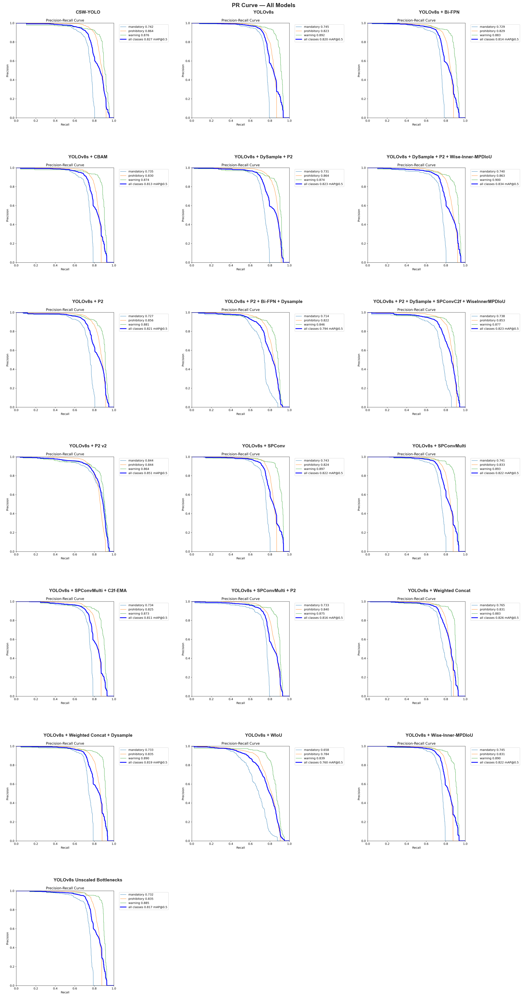

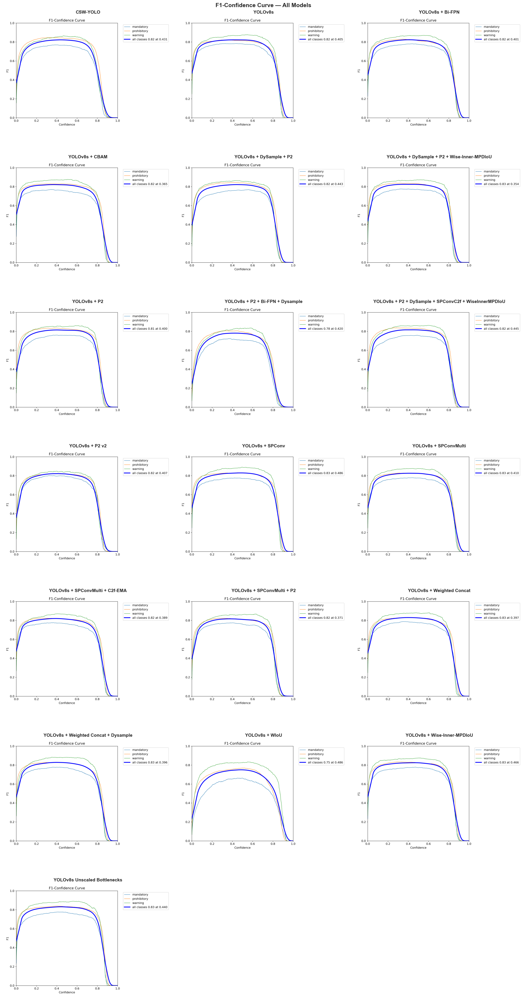

In [13]:
def load_curve_from_run(run_name, filename):
    """Load a saved curve image from the Ultralytics run folder."""
    path = RUNS_DIR / run_name / 'train' / filename
    if path.exists():
        return np.array(Image.open(path))
    return None

# Ultralytics saves: PR_curve.png, F1_curve.png, P_curve.png, R_curve.png
curve_files = {
    'BoxPR_curve.png' : 'PR Curve',
    'BoxF1_curve.png' : 'F1-Confidence Curve',
}

for fname, ftitle in curve_files.items():
    runs_with_curve = [(run, label) for run, label in EXPERIMENTS.items()
                       if (RUNS_DIR / run / 'train' / fname).exists()]
    if not runs_with_curve:
        print(f"  [skip] No {fname} found in any run folder")
        continue

    n = len(runs_with_curve)
    ncols = min(n, 3)
    nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(6 * ncols, 5 * nrows),
                             squeeze=False)
    axes_flat = axes.flatten()
    for ax, (run, label) in zip(axes_flat, runs_with_curve):
        img = load_curve_from_run(run, fname)
        ax.imshow(img)
        ax.set_title(label, fontweight='bold', fontsize=11)
        ax.axis('off')
    for ax in axes_flat[len(runs_with_curve):]:
        ax.set_visible(False)
    plt.suptitle(ftitle + ' — All Models', fontsize=14, fontweight='bold')
    plt.tight_layout()
    save_name = f"{RESULT_PATH}/analysis_{fname.replace('.png','').lower()}_grid.png"
    plt.savefig(save_name, dpi=150, bbox_inches='tight')
    plt.show()

## 5. Per-Class AP Breakdown

In [22]:
def run_val_and_get_per_class_ap(run_name, label):
    """Run model.val() and extract per-class AP50 from the validator."""
    wt = RUNS_DIR / run_name / 'train' / 'weights' / 'best.pt'
    if not wt.exists():
        print(f"  [skip] {label}: no weights")
        return None
    model = YOLO(str(wt))
    metrics = model.val(
        data=str(DATA_YAML),
        imgsz=IMGSZ,
        conf=CONF_THRES,
        iou=IOU_THRES,
        device=DEVICE,
        verbose=False,
        save=False,
        plots=False,
    )

    ap50 = metrics.box.ap50
    maps = metrics.box.maps          # per-class mAP@0.5:0.95
    return {
        'ap50': dict(zip(CLASS_NAMES, ap50)),
        'maps': dict(zip(CLASS_NAMES, maps)),
        'map50_overall': metrics.box.map50,
        'map5095_overall': metrics.box.map,
    }

per_class_results = {}
for run, label in EXPERIMENTS.items():
    print(f"  Validating: {label}...")
    r = run_val_and_get_per_class_ap(run, label)
    if r:
        per_class_results[label] = r
        print(f"    mAP@0.5={r['map50_overall']:.4f}  mAP@0.5:0.95={r['map5095_overall']:.4f}")

  Validating: CSW-YOLO...
Ultralytics 8.4.51  Python-3.14.4 torch-2.12.0+cu130 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
YOLOv8s-csw summary (fused): 143 layers, 8,690,092 parameters, 0 gradients, 29.4 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 1172.8203.8 MB/s, size: 189.4 KB)
val: Scanning D:\deep-learning\datasets\cctsdb2021-full\labels\test.cache... 1500 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1500/1500 449.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 94/94 8.7it/s 10.8s0.1s
                   all       1500       3228      0.885      0.771      0.784      0.514
Speed: 0.7ms preprocess, 4.9ms inference, 0.0ms loss, 0.5ms postprocess per image
    mAP@0.5=0.7837  mAP@0.5:0.95=0.5144
  Validating: ES-YOLO...
Ultralytics 8.4.51  Python-3.14.4 torch-2.12.0+cu130 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
es-YOLO summary: 129 layers, 8,592,927 parameters, 0 gradients, 40.8 GFLOPs
val: Fas

Exception ignored while calling deallocator <function _MultiProcessingDataLoaderIter.__del__ at 0x000001C0DF14DBC0>:
Traceback (most recent call last):
  File "c:\Users\s2\anaconda3\envs\deep-learning\Lib\site-packages\torch\utils\data\dataloader.py", line 1686, in __del__
    self._shutdown_workers()
  File "c:\Users\s2\anaconda3\envs\deep-learning\Lib\site-packages\torch\utils\data\dataloader.py", line 1644, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 94/94 9.8it/s 9.6s0.2s
                   all       1500       3228      0.887      0.769      0.779      0.517
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 0.5ms postprocess per image
    mAP@0.5=0.7795  mAP@0.5:0.95=0.5174
  Validating: YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU...
Ultralytics 8.4.51  Python-3.14.4 torch-2.12.0+cu130 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
YOLOv8s-p2_dysample summary (fused): 68 layers, 3,314,521 parameters, 0 gradients, 29.8 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 2049.0652.4 MB/s, size: 166.9 KB)
val: Scanning D:\deep-learning\datasets\cctsdb2021-full\labels\test.cache... 1500 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1500/1500 449.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 94/94 9.6it/s 9.7s0.1ss
                   all       150

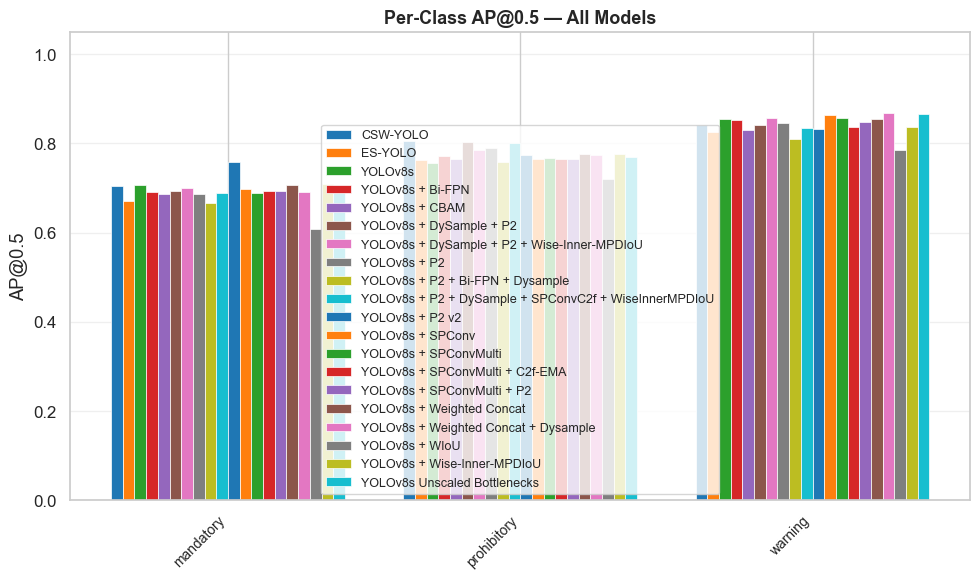


Per-class AP@0.5:
                                                       mandatory  prohibitory  warning
CSW-YOLO                                                  0.7040       0.8058   0.8412
ES-YOLO                                                   0.6711       0.7636   0.8268
YOLOv8s                                                   0.7066       0.7560   0.8559
YOLOv8s + Bi-FPN                                          0.6922       0.7712   0.8522
YOLOv8s + CBAM                                            0.6873       0.7659   0.8299
YOLOv8s + DySample + P2                                   0.6938       0.8029   0.8417
YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU               0.6996       0.7852   0.8571
YOLOv8s + P2                                              0.6876       0.7904   0.8453
YOLOv8s + P2 + Bi-FPN + Dysample                          0.6673       0.7588   0.8102
YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU     0.6882       0.8012   0.8349
YOLOv8s + P2 v2         

In [23]:
# Build per-class AP50 DataFrame and plot
ap50_df = pd.DataFrame(
    {label: r['ap50'] for label, r in per_class_results.items()}
).T

fig, ax = plt.subplots(figsize=(max(10, NC * 1.2), 6))
x = np.arange(NC)
w = 0.8 / len(ap50_df)
for i, (label, row) in enumerate(ap50_df.iterrows()):
    ax.bar(x + i * w, row.values, width=w, label=label,
           color=PALETTE[i], edgecolor='white', linewidth=0.5)
ax.set_xticks(x + w * (len(ap50_df) - 1) / 2)
ax.set_xticklabels(CLASS_NAMES, rotation=45, ha='right', fontsize=10)
ax.set_ylabel('AP@0.5')
ax.set_title('Per-Class AP@0.5 — All Models', fontweight='bold', fontsize=13)
ax.legend(fontsize=9)
ax.set_ylim(0, 1.05)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(f'{RESULT_PATH}/analysis_perclass_ap50.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nPer-class AP@0.5:")
print(ap50_df.round(4).to_string())

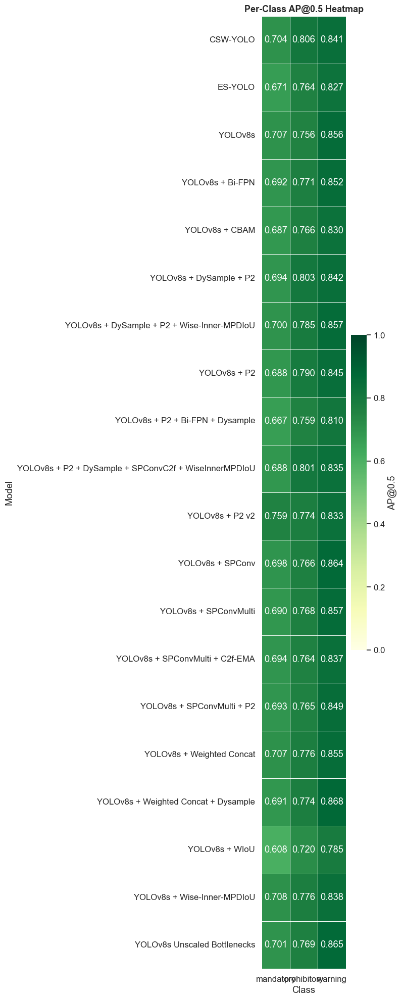

In [24]:
# Heatmap view: models × classes
fig, ax = plt.subplots(figsize=(max(8, NC * 0.9), len(ap50_df) * 0.9 + 2))
sns.heatmap(ap50_df.astype(float), annot=True, fmt='.3f',
            cmap='YlGn', vmin=0, vmax=1,
            linewidths=0.5, ax=ax, cbar_kws={'label': 'AP@0.5'})
ax.set_title('Per-Class AP@0.5 Heatmap', fontweight='bold', fontsize=13)
ax.set_xlabel('Class')
ax.set_ylabel('Model')
plt.tight_layout()
plt.savefig(f'{RESULT_PATH}/analysis_perclass_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

## 6. Inference Speed Benchmark (FPS)

In [25]:
import time

def benchmark_fps(run_name, label, n_warmup=10, n_runs=100):
    wt = RUNS_DIR / run_name / 'train' / 'weights' / 'best.pt'
    if not wt.exists():
        return None
    model = YOLO(str(wt))
    dummy = torch.zeros(1, 3, IMGSZ, IMGSZ).to(DEVICE)
    model.model.to(DEVICE).eval()

    # Warmup
    with torch.no_grad():
        for _ in range(n_warmup):
            _ = model.model(dummy)

    # Timed runs
    if 'cuda' in DEVICE:
        torch.cuda.synchronize()
    t0 = time.perf_counter()
    with torch.no_grad():
        for _ in range(n_runs):
            _ = model.model(dummy)
    if 'cuda' in DEVICE:
        torch.cuda.synchronize()
    elapsed = time.perf_counter() - t0
    fps = n_runs / elapsed
    ms  = elapsed / n_runs * 1000
    print(f"  {label:30s}  {fps:.1f} FPS  ({ms:.2f} ms/img)")
    return {'FPS': round(fps, 1), 'Latency (ms)': round(ms, 2)}

speed_results = {}
for run, label in EXPERIMENTS.items():
    r = benchmark_fps(run, label)
    if r:
        speed_results[label] = r

speed_df = pd.DataFrame(speed_results).T
print("\n", speed_df.to_string())

  CSW-YOLO                        114.9 FPS  (8.70 ms/img)
  ES-YOLO                         65.3 FPS  (15.32 ms/img)
  YOLOv8s                         154.4 FPS  (6.48 ms/img)
  YOLOv8s + Bi-FPN                142.5 FPS  (7.02 ms/img)
  YOLOv8s + CBAM                  147.8 FPS  (6.77 ms/img)
  YOLOv8s + DySample + P2         123.7 FPS  (8.08 ms/img)
  YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU  124.7 FPS  (8.02 ms/img)
  YOLOv8s + P2                    122.4 FPS  (8.17 ms/img)
  YOLOv8s + P2 + Bi-FPN + Dysample  120.2 FPS  (8.32 ms/img)
  YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU  123.9 FPS  (8.07 ms/img)
  YOLOv8s + P2 v2                 135.2 FPS  (7.40 ms/img)
  YOLOv8s + SPConv                116.3 FPS  (8.60 ms/img)
  YOLOv8s + SPConvMulti           155.3 FPS  (6.44 ms/img)
  YOLOv8s + SPConvMulti + C2f-EMA  143.6 FPS  (6.97 ms/img)
  YOLOv8s + SPConvMulti + P2      135.2 FPS  (7.40 ms/img)
  YOLOv8s + Weighted Concat       146.7 FPS  (6.82 ms/img)
  YOLOv8s + Weigh

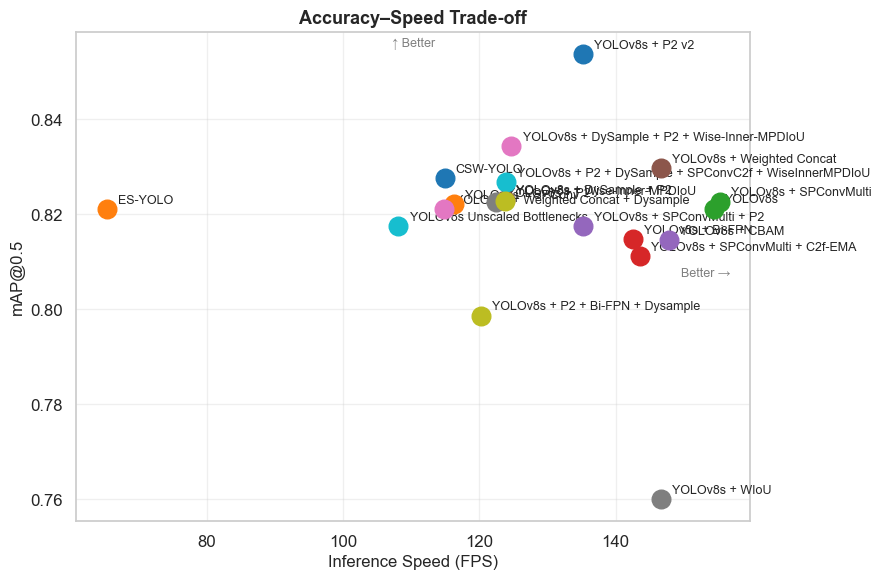

In [26]:
# mAP vs FPS scatter — the key thesis trade-off plot
fig, ax = plt.subplots(figsize=(9, 6))
for i, label in enumerate(speed_df.index):
    if label not in summary_df.index:
        continue
    fps = speed_df.loc[label, 'FPS']
    map50 = summary_df.loc[label, 'mAP@0.5']
    ax.scatter(fps, map50, s=180, color=PALETTE[i], zorder=5)
    ax.annotate(label, (fps, map50),
                textcoords='offset points', xytext=(8, 4), fontsize=9)

ax.set_xlabel('Inference Speed (FPS)', fontsize=12)
ax.set_ylabel('mAP@0.5', fontsize=12)
ax.set_title('Accuracy–Speed Trade-off', fontweight='bold', fontsize=13)
ax.grid(True, alpha=0.3)
ax.annotate('Better →', xy=(0.97, 0.5), xycoords='axes fraction',
             ha='right', fontsize=9, color='gray')
ax.annotate('↑ Better', xy=(0.5, 0.97), xycoords='axes fraction',
             ha='center', fontsize=9, color='gray')
plt.tight_layout()
plt.savefig(f'{RESULT_PATH}/analysis_accuracy_speed.png', dpi=150, bbox_inches='tight')
plt.show()

## 7. Detection Visualization

In [27]:
def get_val_images(n=6, seed=42):
    """Sample n validation images."""
    imgs = sorted(glob.glob(str(VAL_IMG_DIR / '*.jpg')) +
                  glob.glob(str(VAL_IMG_DIR / '*.png')))
    rng = np.random.default_rng(seed)
    return rng.choice(imgs, min(n, len(imgs)), replace=False).tolist()

SAMPLE_IMGS = get_val_images(n=6)
print(f"Sampled {len(SAMPLE_IMGS)} validation images")

Sampled 6 validation images


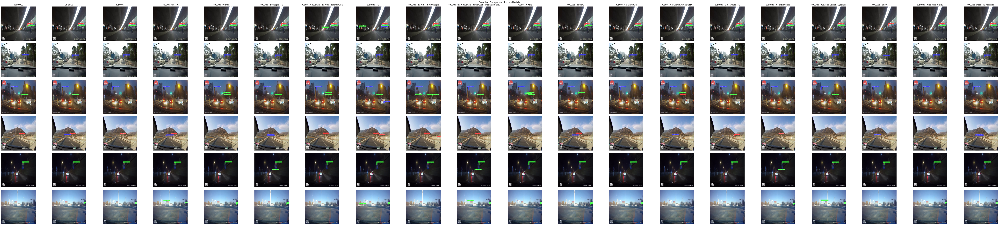

In [28]:
CLASS_COLORS = [
    (255, 56,  56),   # red
    (56,  255, 56),   # green
    (56,  56,  255),  # blue
    (255, 200, 0),    # yellow
    (200, 0,   255),  # purple
    (0,   200, 255),  # cyan
]

def draw_predictions(img_bgr, result, conf_thres=CONF_THRES):
    """Draw bounding boxes + labels on a BGR image copy."""
    canvas = img_bgr.copy()
    boxes = result.boxes
    if boxes is None or len(boxes) == 0:
        return canvas
    for box in boxes:
        conf = float(box.conf)
        if conf < conf_thres:
            continue
        cls  = int(box.cls)
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        color = CLASS_COLORS[cls % len(CLASS_COLORS)]
        cv2.rectangle(canvas, (x1, y1), (x2, y2), color, 2)
        name  = CLASS_NAMES[cls] if cls < len(CLASS_NAMES) else str(cls)
        label = f"{name} {conf:.2f}"
        (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(canvas, (x1, y1 - th - 6), (x1 + tw + 4, y1), color, -1)
        cv2.putText(canvas, label, (x1 + 2, y1 - 4),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
    return canvas

def visualize_predictions_grid(img_paths, experiments_subset=None, figsize_per=(4, 3)):
    """
    Grid: rows = images, cols = models.
    experiments_subset: dict subset of EXPERIMENTS to compare; defaults to all.
    """
    exps = experiments_subset or EXPERIMENTS
    exp_list = [(run, label) for run, label in exps.items()
                if (RUNS_DIR / run / 'train' / 'weights' / 'best.pt').exists()]
    n_imgs = len(img_paths)
    n_cols = len(exp_list)
    fig, axes = plt.subplots(n_imgs, n_cols,
                             figsize=(figsize_per[0] * n_cols,
                                      figsize_per[1] * n_imgs))
    if n_imgs == 1: axes = axes[np.newaxis, :]
    if n_cols == 1: axes = axes[:, np.newaxis]

    models = {}
    for run, label in exp_list:
        models[label] = YOLO(str(RUNS_DIR / run / 'train' / 'weights' / 'best.pt'))

    for row, img_path in enumerate(img_paths):
        img_bgr = cv2.imread(img_path)
        img_bgr = cv2.resize(img_bgr, (IMGSZ, IMGSZ))
        for col, (run, label) in enumerate(exp_list):
            result = models[label](img_bgr, conf=CONF_THRES, iou=IOU_THRES,
                                   imgsz=IMGSZ, verbose=False)[0]
            drawn = draw_predictions(img_bgr, result)
            axes[row, col].imshow(cv2.cvtColor(drawn, cv2.COLOR_BGR2RGB))
            if row == 0:
                axes[row, col].set_title(label, fontweight='bold', fontsize=10)
            axes[row, col].axis('off')

    plt.suptitle('Detection Comparison Across Models', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'{RESULT_PATH}/analysis_detection_grid.png', dpi=150, bbox_inches='tight')
    plt.show()

visualize_predictions_grid(SAMPLE_IMGS)

## 8. GradCAM Visualization

In [29]:
def print_model_layers(run):
    wt = RUNS_DIR / run / 'train' / 'weights' / 'best.pt'
    det = YOLO(str(wt)).model
    print(f"\n{run}:")
    for i, layer in enumerate(det.model):
        print(f"  [{i:2d}] {type(layer).__name__}")

In [30]:
model_backbone = {}
model_neck = {}
for run, label in EXPERIMENTS.items():
    wt = RUNS_DIR / run / 'train' / 'weights' / 'best.pt'
    det = YOLO(str(wt)).model
    print(f"\n{label}:")
    for i, layer in enumerate(det.model):
        print(f"  [{i:2d}] {type(layer).__name__}")
        if type(layer).__name__ == "SPPF":
            model_backbone[label] = i - 1
        if type(layer).__name__ == "Detect":
            model_neck[label] = i - 1
model_backbone, model_neck


CSW-YOLO:
  [ 0] Conv
  [ 1] Conv
  [ 2] C2f_Faster_CGLU
  [ 3] Conv
  [ 4] C2f_Faster_CGLU
  [ 5] Conv
  [ 6] C2f_Faster
  [ 7] Conv
  [ 8] C2f_Faster_CGLU
  [ 9] SPPF_LSKA
  [10] Upsample
  [11] Concat
  [12] C2f_Faster_CGLU
  [13] Upsample
  [14] Concat
  [15] C2f_Faster
  [16] Upsample
  [17] Concat
  [18] C2f_Faster_CGLU
  [19] Conv
  [20] Concat
  [21] C2f_Faster
  [22] Conv
  [23] Concat
  [24] C2f_Faster_CGLU
  [25] Conv
  [26] Concat
  [27] C2f_Faster_CGLU
  [28] Detect

ES-YOLO:
  [ 0] EdgeFEBlock
  [ 1] Index
  [ 2] Index
  [ 3] AFFM
  [ 4] ShapeConv
  [ 5] C2f
  [ 6] EFE
  [ 7] AFFM
  [ 8] Conv
  [ 9] C2f
  [10] EFE
  [11] AFFM
  [12] Conv
  [13] C2f
  [14] EFE
  [15] AFFM
  [16] Conv
  [17] C2f
  [18] SPPF
  [19] Upsample
  [20] Concat
  [21] C2f
  [22] Upsample
  [23] Concat
  [24] C2f
  [25] Upsample
  [26] Concat
  [27] C2f
  [28] SimAM
  [29] Conv
  [30] Concat
  [31] C2f
  [32] Conv
  [33] Concat
  [34] C2f
  [35] Detect

YOLOv8s:
  [ 0] Conv
  [ 1] Conv
  [ 2] C2f
 

({'ES-YOLO': 17,
  'YOLOv8s': 8,
  'YOLOv8s + Bi-FPN': 8,
  'YOLOv8s + CBAM': 8,
  'YOLOv8s + DySample + P2': 6,
  'YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU': 6,
  'YOLOv8s + P2': 8,
  'YOLOv8s + P2 + Bi-FPN + Dysample': 6,
  'YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU': 6,
  'YOLOv8s + P2 v2': 6,
  'YOLOv8s + SPConv': 8,
  'YOLOv8s + SPConvMulti': 8,
  'YOLOv8s + SPConvMulti + C2f-EMA': 8,
  'YOLOv8s + SPConvMulti + P2': 6,
  'YOLOv8s + Weighted Concat': 8,
  'YOLOv8s + Weighted Concat + Dysample': 8,
  'YOLOv8s + WIoU': 8,
  'YOLOv8s + Wise-Inner-MPDIoU': 8,
  'YOLOv8s Unscaled Bottlenecks': 8},
 {'CSW-YOLO': 27,
  'ES-YOLO': 34,
  'YOLOv8s': 21,
  'YOLOv8s + Bi-FPN': 24,
  'YOLOv8s + CBAM': 22,
  'YOLOv8s + DySample + P2': 19,
  'YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU': 19,
  'YOLOv8s + P2': 24,
  'YOLOv8s + P2 + Bi-FPN + Dysample': 22,
  'YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU': 19,
  'YOLOv8s + P2 v2': 19,
  'YOLOv8s + SPConv': 21,
  'YOLOv8s + SP

In [31]:
# ── GradCAM using pytorch-grad-cam ─────────────────────────────────────────
from pytorch_grad_cam import GradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

class YOLOv8GradCAMWrapper(torch.nn.Module):
    def __init__(self, detection_model):
        super().__init__()
        self.model = detection_model

    def forward(self, x):
        return self.model._predict_once(x)


def get_target_layer(detection_model, layer_idx):
    return detection_model.model[layer_idx]


def run_inference(run_name, img_bgr):
    """Run YOLO inference and return (boxes_xyxy, confs, cls_ids) in pixel coords."""
    wt = RUNS_DIR / run_name / 'train' / 'weights' / 'best.pt'
    yolo = YOLO(str(wt))
    result = yolo(img_bgr, conf=CONF_THRES, iou=IOU_THRES,
                  imgsz=IMGSZ, verbose=False)[0]
    boxes, confs, cls_ids = [], [], []
    if result.boxes is not None:
        for b in result.boxes:
            boxes.append(b.xyxy[0].cpu().numpy().astype(int))
            confs.append(float(b.conf))
            cls_ids.append(int(b.cls))
    return boxes, confs, cls_ids


def draw_boxes_on_image(img_rgb_uint8, boxes, confs, cls_ids,
                         class_names, box_alpha=0.85):
    """
    Draw bounding boxes on a uint8 RGB image (copy).
    Returns the annotated image as uint8 RGB numpy array.
    """
    BOX_COLORS = [
        (220,  50,  50),   # red   — mandatory
        ( 50, 180,  50),   # green — prohibitory
        ( 50, 130, 220),   # blue  — warning
        (200, 150,  20),   # amber
        (180,  50, 200),   # purple
    ]
    canvas = img_rgb_uint8.copy()
    for (x1, y1, x2, y2), conf, cls in zip(boxes, confs, cls_ids):
        color = BOX_COLORS[cls % len(BOX_COLORS)]
        # draw rectangle
        cv2.rectangle(canvas, (x1, y1), (x2, y2), color, 2)
        # label background + text
        name  = class_names[cls] if cls < len(class_names) else str(cls)
        label = f"{name} {conf:.2f}"
        (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.45, 1)
        cv2.rectangle(canvas, (x1, y1 - th - 6), (x1 + tw + 4, y1), color, -1)
        cv2.putText(canvas, label, (x1 + 2, y1 - 4),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.45, (255, 255, 255), 1,
                    cv2.LINE_AA)
    return canvas


def yolov8_gradcam(run_name, img_path, layer_idx=8, cam_class=EigenCAM):
    """
    Returns:
      img_rgb      — original uint8 RGB (640x640)
      overlay      — EigenCAM heatmap blended onto image (uint8 RGB)
      grayscale    — raw CAM map (H x W float32)
      boxes/confs/cls_ids — inference results for bbox overlay
    """
    wt = RUNS_DIR / run_name / 'train' / 'weights' / 'best.pt'
    yolo      = YOLO(str(wt))
    det_model = yolo.model
    det_model.eval().to(DEVICE)

    target_layer = get_target_layer(det_model, layer_idx)
    print(f"  [{layer_idx}] → {type(target_layer).__name__}")

    wrapped = YOLOv8GradCAMWrapper(det_model).to(DEVICE)

    img_bgr = cv2.imread(img_path)
    img_bgr = cv2.resize(img_bgr, (IMGSZ, IMGSZ))
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_f32 = img_rgb.astype(np.float32) / 255.0
    tensor  = torch.from_numpy(img_f32).permute(2, 0, 1).unsqueeze(0).to(DEVICE)

    # ── EigenCAM ──────────────────────────────────────────────────────────
    with cam_class(model=wrapped, target_layers=[target_layer]) as cam:
        grayscale_cam = cam(input_tensor=tensor, targets=None)[0]
    overlay = show_cam_on_image(img_f32, grayscale_cam, use_rgb=True)

    # ── inference for bbox overlay ─────────────────────────────────────────
    boxes, confs, cls_ids = run_inference(run_name, img_bgr)

    return img_rgb, overlay, grayscale_cam, boxes, confs, cls_ids


def make_legend_patches(class_names):
    BOX_COLORS = [
        (220/255,  50/255,  50/255),
        ( 50/255, 180/255,  50/255),
        ( 50/255, 130/255, 220/255),
        (200/255, 150/255,  20/255),
        (180/255,  50/255, 200/255),
    ]
    return [mpatches.Patch(color=BOX_COLORS[i % len(BOX_COLORS)], label=n)
            for i, n in enumerate(class_names)]


print("GradCAM helpers defined.")


GradCAM helpers defined.


  [8] → C2f_Faster_CGLU
  [17] → C2f
  [8] → C2f
  [8] → C2f
  [8] → C2f
  [6] → C2f
  [6] → C2f
  [8] → C2f
  [6] → C2f
  [6] → SPConvC2f
  [6] → C2f
  [8] → C2f
  [8] → C2f
  [8] → C2f
  [6] → SPConvC2f
  [8] → C2f
  [8] → C2f
  [8] → C2f
  [8] → C2f
  [8] → C2f


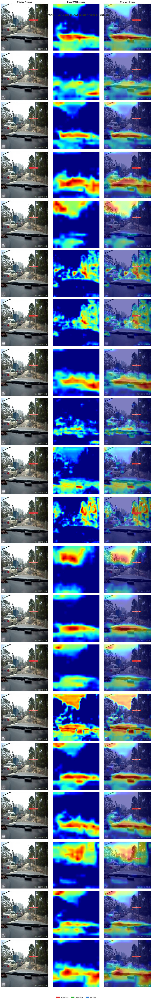

In [32]:
# ── GradCAM grid: rows = models, cols = (original+boxes | heatmap | overlay+boxes)
GRADCAM_IMG   = SAMPLE_IMGS[1]
GRADCAM_LAYER = {label: int(idx) for label, idx in model_backbone.items()}

n_models = len(EXPERIMENTS)
fig, axes = plt.subplots(n_models, 3, figsize=(13, 4 * n_models))
if n_models == 1:
    axes = axes[np.newaxis, :]

col_titles = ['Original + boxes', 'EigenCAM heatmap', 'Overlay + boxes']
for col_i, t in enumerate(col_titles):
    axes[0, col_i].set_title(t, fontweight='bold', fontsize=11)

legend_patches = make_legend_patches(CLASS_NAMES)

for row, (run, label) in enumerate(EXPERIMENTS.items()):
    wt = RUNS_DIR / run / 'train' / 'weights' / 'best.pt'
    if not wt.exists():
        for ax in axes[row]: ax.axis('off')
        continue

    try:
        idx = int(GRADCAM_LAYER.get(label, 8))
        orig, overlay, gray, boxes, confs, cls_ids = yolov8_gradcam(
            run, GRADCAM_IMG, layer_idx=idx)

        # col 0: original image with boxes
        orig_boxes = draw_boxes_on_image(orig, boxes, confs, cls_ids, CLASS_NAMES)
        axes[row, 0].imshow(orig_boxes)

        # col 1: raw heatmap (no boxes — keep it clean for interpretation)
        axes[row, 1].imshow(gray, cmap='jet')

        # col 2: overlay with boxes on top
        overlay_boxes = draw_boxes_on_image(overlay, boxes, confs, cls_ids, CLASS_NAMES)
        axes[row, 2].imshow(overlay_boxes)

        axes[row, 0].set_ylabel(label, fontsize=9, rotation=0,
                                 labelpad=90, va='center')
    except Exception as e:
        print(f"  [warn] GradCAM failed for {label}: {e}")

    for ax in axes[row]: ax.axis('off')

# shared legend at the bottom
fig.legend(handles=legend_patches, loc='lower center', ncol=len(CLASS_NAMES),
           fontsize=9, frameon=False, bbox_to_anchor=(0.5, -0.01))

plt.suptitle('EigenCAM — Last Backbone C2f  (boxes = model predictions)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{RESULT_PATH}/analysis_gradcam_grid.png', dpi=150, bbox_inches='tight')
plt.show()


In [33]:
EXPERIMENTS

{'CSW-YOLO': 'CSW-YOLO',
 'ES-YOLO': 'ES-YOLO',
 'YOLOv8s': 'YOLOv8s',
 'YOLOv8s + Bi-FPN': 'YOLOv8s + Bi-FPN',
 'YOLOv8s + CBAM': 'YOLOv8s + CBAM',
 'YOLOv8s + DySample + P2': 'YOLOv8s + DySample + P2',
 'YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU': 'YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU',
 'YOLOv8s + P2': 'YOLOv8s + P2',
 'YOLOv8s + P2 + Bi-FPN + Dysample': 'YOLOv8s + P2 + Bi-FPN + Dysample',
 'YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU': 'YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU',
 'YOLOv8s + P2 v2': 'YOLOv8s + P2 v2',
 'YOLOv8s + SPConv': 'YOLOv8s + SPConv',
 'YOLOv8s + SPConvMulti': 'YOLOv8s + SPConvMulti',
 'YOLOv8s + SPConvMulti + C2f-EMA': 'YOLOv8s + SPConvMulti + C2f-EMA',
 'YOLOv8s + SPConvMulti + P2': 'YOLOv8s + SPConvMulti + P2',
 'YOLOv8s + Weighted Concat': 'YOLOv8s + Weighted Concat',
 'YOLOv8s + Weighted Concat + Dysample': 'YOLOv8s + Weighted Concat + Dysample',
 'YOLOv8s + WIoU': 'YOLOv8s + WIoU',
 'YOLOv8s + Wise-Inner-MPDIoU': 'YOLOv8s

In [34]:
selected_model = EXPERIMENTS['YOLOv8s + P2 v2']
print_model_layers(selected_model)


YOLOv8s + P2 v2:
  [ 0] Conv
  [ 1] Conv
  [ 2] C2f
  [ 3] Conv
  [ 4] C2f
  [ 5] Conv
  [ 6] C2f
  [ 7] SPPF
  [ 8] Upsample
  [ 9] Concat
  [10] C2f
  [11] Upsample
  [12] Concat
  [13] C2f
  [14] Conv
  [15] Concat
  [16] C2f
  [17] Conv
  [18] Concat
  [19] C2f
  [20] Detect


  [2] → C2f
  [4] → C2f
  [6] → C2f
  [13] → C2f
  [16] → C2f
  [19] → C2f


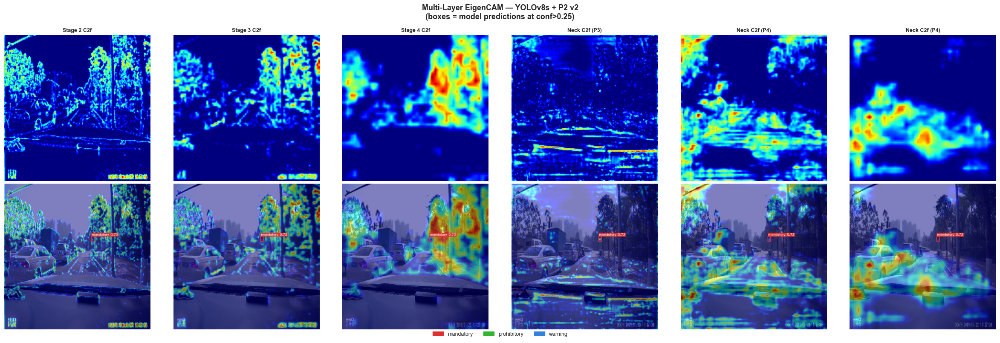

In [35]:
# ── Multi-layer EigenCAM for a single model ─────────────────────────────
# rows: top = heatmap, bottom = overlay + boxes
INSPECT_RUN   = selected_model
INSPECT_LABEL = EXPERIMENTS[INSPECT_RUN]
LAYERS_TO_VIZ = [
    (2,  'Stage 2 C2f'),
    (4,  'Stage 3 C2f'),
    (6,  'Stage 4 C2f'),
    (13, 'Neck C2f (P3)'),
    (16, 'Neck C2f (P4)'),
    (19, 'Neck C2f (P4)'),
]

n_cols = len(LAYERS_TO_VIZ)
fig, axes = plt.subplots(2, n_cols, figsize=(4 * n_cols, 8))

# run inference once — same boxes drawn on every overlay column
img_bgr_inspect = cv2.resize(cv2.imread(GRADCAM_IMG), (IMGSZ, IMGSZ))
boxes_i, confs_i, cls_i = run_inference(INSPECT_RUN, img_bgr_inspect)

for col_i, (layer_idx, layer_title) in enumerate(LAYERS_TO_VIZ):
    try:
        orig, overlay, gray, _, _, _ = yolov8_gradcam(
            INSPECT_RUN, GRADCAM_IMG, layer_idx=layer_idx)

        # row 0: clean heatmap
        axes[0, col_i].imshow(gray, cmap='jet')

        # row 1: overlay + boxes
        overlay_boxes = draw_boxes_on_image(
            overlay, boxes_i, confs_i, cls_i, CLASS_NAMES)
        axes[1, col_i].imshow(overlay_boxes)

        axes[0, col_i].set_title(layer_title, fontsize=9, fontweight='bold')
    except Exception as e:
        axes[0, col_i].text(0.5, 0.5, f'Error\n{e}', ha='center', va='center',
                             transform=axes[0, col_i].transAxes, fontsize=8)
    axes[0, col_i].axis('off')
    axes[1, col_i].axis('off')

axes[0, 0].set_ylabel('Heatmap', fontsize=10, rotation=0, labelpad=55, va='center')
axes[1, 0].set_ylabel('Overlay + boxes', fontsize=10, rotation=0, labelpad=80, va='center')

legend_patches = make_legend_patches(CLASS_NAMES)
fig.legend(handles=legend_patches, loc='lower center', ncol=len(CLASS_NAMES),
           fontsize=9, frameon=False, bbox_to_anchor=(0.5, -0.01))

plt.suptitle(f'Multi-Layer EigenCAM — {INSPECT_LABEL}\n'
             f'(boxes = model predictions at conf>{CONF_THRES})',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{RESULT_PATH}/analysis_multilayer_gradcam.png', dpi=150, bbox_inches='tight')
plt.show()

## 9. Error Analysis

In [36]:
def parse_gt_label(lbl_path, img_w, img_h):
    """Parse YOLO .txt label → list of (cls, x1, y1, x2, y2) in pixel coords."""
    boxes = []
    if not os.path.exists(lbl_path):
        return boxes
    with open(lbl_path) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            cls, cx, cy, bw, bh = int(parts[0]), *map(float, parts[1:5])
            x1 = int((cx - bw / 2) * img_w)
            y1 = int((cy - bh / 2) * img_h)
            x2 = int((cx + bw / 2) * img_w)
            y2 = int((cy + bh / 2) * img_h)
            boxes.append((cls, x1, y1, x2, y2))
    return boxes

def box_iou_single(b1, b2):
    """IoU between two boxes (x1,y1,x2,y2)."""
    ix1, iy1 = max(b1[0], b2[0]), max(b1[1], b2[1])
    ix2, iy2 = min(b1[2], b2[2]), min(b1[3], b2[3])
    inter = max(0, ix2 - ix1) * max(0, iy2 - iy1)
    a1 = (b1[2]-b1[0]) * (b1[3]-b1[1])
    a2 = (b2[2]-b2[0]) * (b2[3]-b2[1])
    return inter / (a1 + a2 - inter + 1e-6)

def classify_predictions(result, gt_boxes, iou_thresh=0.5):
    """
    For each predicted box, classify as:
      TP  : matched GT box, same class
      CLS : matched GT box, wrong class
      FP  : no matching GT box
    GT boxes with no prediction match → FN
    Returns counts and lists.
    """
    preds = []
    boxes_obj = result.boxes
    if boxes_obj is not None:
        for b in boxes_obj:
            cls  = int(b.cls)
            conf = float(b.conf)
            x1, y1, x2, y2 = map(int, b.xyxy[0].tolist())
            preds.append((cls, conf, x1, y1, x2, y2))

    matched_gt = set()
    tp = fp = cls_err = 0
    tp_confs, fp_confs = [], []

    for pcls, pconf, px1, py1, px2, py2 in preds:
        best_iou, best_idx = 0, -1
        for gi, (gcls, gx1, gy1, gx2, gy2) in enumerate(gt_boxes):
            iou = box_iou_single((px1, py1, px2, py2), (gx1, gy1, gx2, gy2))
            if iou > best_iou:
                best_iou, best_idx = iou, gi
        if best_iou >= iou_thresh and best_idx not in matched_gt:
            matched_gt.add(best_idx)
            if pcls == gt_boxes[best_idx][0]:
                tp += 1; tp_confs.append(pconf)
            else:
                cls_err += 1; fp_confs.append(pconf)
        else:
            fp += 1; fp_confs.append(pconf)

    fn = len(gt_boxes) - len(matched_gt)
    return {'TP': tp, 'FP': fp, 'FN': fn, 'CLS_ERR': cls_err,
            'tp_confs': tp_confs, 'fp_confs': fp_confs}

print("Error analysis helpers defined.")

Error analysis helpers defined.


In [37]:
# Run error analysis on all validation images for each model
# (uses up to MAX_VAL_IMGS to keep runtime manageable)
MAX_VAL_IMGS = 200

all_imgs = sorted(glob.glob(str(VAL_IMG_DIR / '*.jpg')) +
                  glob.glob(str(VAL_IMG_DIR / '*.png')))
rng = np.random.default_rng(0)
eval_imgs = rng.choice(all_imgs, min(MAX_VAL_IMGS, len(all_imgs)),
                        replace=False).tolist()
print(f"Running error analysis on {len(eval_imgs)} images...")

error_summary = {}
fp_conf_data  = {}   # for confidence distribution analysis

for run, label in EXPERIMENTS.items():
    wt = RUNS_DIR / run / 'train' / 'weights' / 'best.pt'
    if not wt.exists():
        continue
    model = YOLO(str(wt))
    totals = {'TP': 0, 'FP': 0, 'FN': 0, 'CLS_ERR': 0}
    all_fp_confs = []

    for img_path in eval_imgs:
        img = cv2.imread(img_path)
        h, w = img.shape[:2]
        stem = Path(img_path).stem
        lbl_path = VAL_LBL_DIR / f"{stem}.txt"
        gt_boxes = parse_gt_label(str(lbl_path), w, h)

        result = model(img, conf=CONF_THRES, iou=IOU_THRES,
                       imgsz=IMGSZ, verbose=False)[0]
        counts = classify_predictions(result, gt_boxes)
        for k in totals:
            totals[k] += counts[k]
        all_fp_confs.extend(counts['fp_confs'])

    error_summary[label] = totals
    fp_conf_data[label]  = all_fp_confs
    total_pred = totals['TP'] + totals['FP'] + totals['CLS_ERR']
    total_gt   = totals['TP'] + totals['FN'] + totals['CLS_ERR']
    prec = totals['TP'] / (total_pred + 1e-6)
    rec  = totals['TP'] / (total_gt + 1e-6)
    print(f"  {label:30s}  TP={totals['TP']:4d}  FP={totals['FP']:4d}  "
          f"FN={totals['FN']:4d}  CLS_ERR={totals['CLS_ERR']:3d}  "
          f"Prec={prec:.3f}  Rec={rec:.3f}")

Running error analysis on 200 images...
  CSW-YOLO                        TP= 334  FP=  57  FN=  51  CLS_ERR=  5  Prec=0.843  Rec=0.856
  ES-YOLO                         TP= 319  FP=  60  FN=  67  CLS_ERR=  4  Prec=0.833  Rec=0.818
  YOLOv8s                         TP= 326  FP=  44  FN=  62  CLS_ERR=  2  Prec=0.876  Rec=0.836
  YOLOv8s + Bi-FPN                TP= 328  FP=  61  FN=  59  CLS_ERR=  3  Prec=0.837  Rec=0.841
  YOLOv8s + CBAM                  TP= 326  FP=  34  FN=  59  CLS_ERR=  5  Prec=0.893  Rec=0.836
  YOLOv8s + DySample + P2         TP= 331  FP=  55  FN=  56  CLS_ERR=  3  Prec=0.851  Rec=0.849
  YOLOv8s + DySample + P2 + Wise-Inner-MPDIoU  TP= 324  FP=  34  FN=  61  CLS_ERR=  5  Prec=0.893  Rec=0.831
  YOLOv8s + P2                    TP= 335  FP=  58  FN=  51  CLS_ERR=  4  Prec=0.844  Rec=0.859
  YOLOv8s + P2 + Bi-FPN + Dysample  TP= 323  FP=  83  FN=  61  CLS_ERR=  6  Prec=0.784  Rec=0.828
  YOLOv8s + P2 + DySample + SPConvC2f + WiseInnerMPDIoU  TP= 333  FP=  61  FN=  5

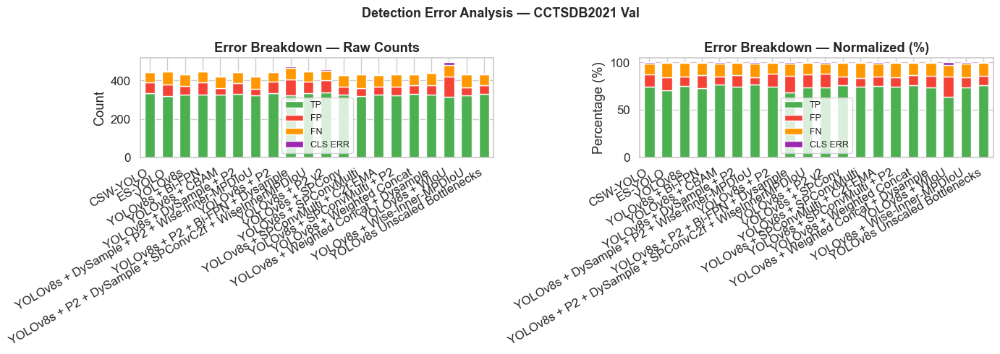

In [38]:
# ── Error breakdown stacked bar ─────────────────────────────────────────────
error_df = pd.DataFrame(error_summary).T
error_df_norm = error_df.div(error_df.sum(axis=1), axis=0) * 100

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Raw counts
error_df[['TP','FP','FN','CLS_ERR']].plot(
    kind='bar', ax=axes[0], stacked=True,
    color=['#4CAF50','#F44336','#FF9800','#9C27B0'],
    edgecolor='white', width=0.6)
axes[0].set_title('Error Breakdown — Raw Counts', fontweight='bold')
axes[0].set_ylabel('Count')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=30, ha='right')
axes[0].legend(['TP','FP','FN','CLS ERR'], fontsize=9)

# Normalized
error_df_norm[['TP','FP','FN','CLS_ERR']].plot(
    kind='bar', ax=axes[1], stacked=True,
    color=['#4CAF50','#F44336','#FF9800','#9C27B0'],
    edgecolor='white', width=0.6)
axes[1].set_title('Error Breakdown — Normalized (%)', fontweight='bold')
axes[1].set_ylabel('Percentage (%)')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=30, ha='right')
axes[1].legend(['TP','FP','FN','CLS ERR'], fontsize=9)

plt.suptitle('Detection Error Analysis — CCTSDB2021 Val',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{RESULT_PATH}/analysis_error_breakdown.png', dpi=150, bbox_inches='tight')
plt.show()

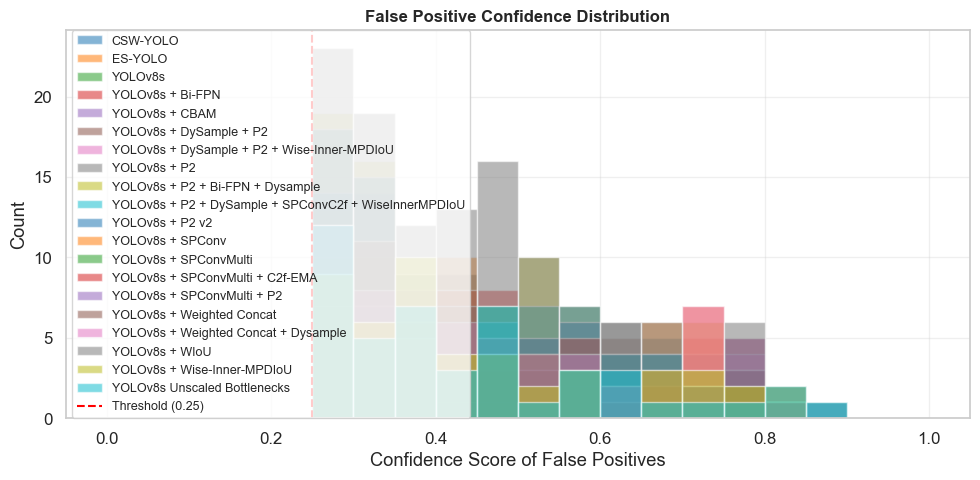

In [39]:
# ── FP confidence distribution ──────────────────────────────────────────────
# Low-confidence FPs → suppress with threshold; high-confidence FPs → hard negatives
fig, ax = plt.subplots(figsize=(10, 5))
for i, (label, confs) in enumerate(fp_conf_data.items()):
    if confs:
        ax.hist(confs, bins=20, range=(0, 1), alpha=0.55,
                label=label, color=PALETTE[i], edgecolor='white')
ax.set_xlabel('Confidence Score of False Positives')
ax.set_ylabel('Count')
ax.set_title('False Positive Confidence Distribution', fontweight='bold', fontsize=12)
ax.axvline(CONF_THRES, color='red', linestyle='--', label=f'Threshold ({CONF_THRES})')
ax.legend(fontsize=9)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(f'{RESULT_PATH}/analysis_fp_confidence_dist.png', dpi=150, bbox_inches='tight')
plt.show()

  Confusion matrix: CSW-YOLO...


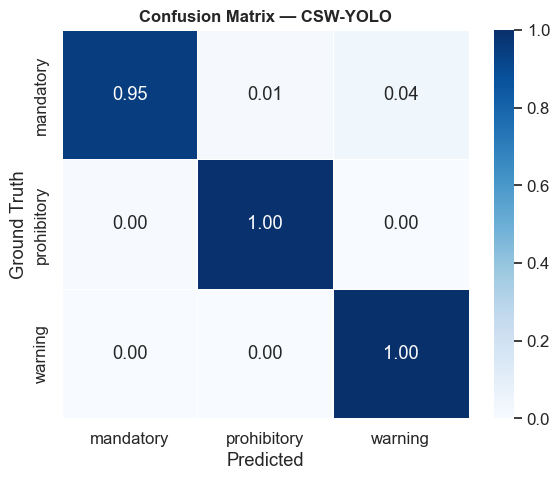

  Confusion matrix: YOLOv8s Unscaled Bottlenecks...


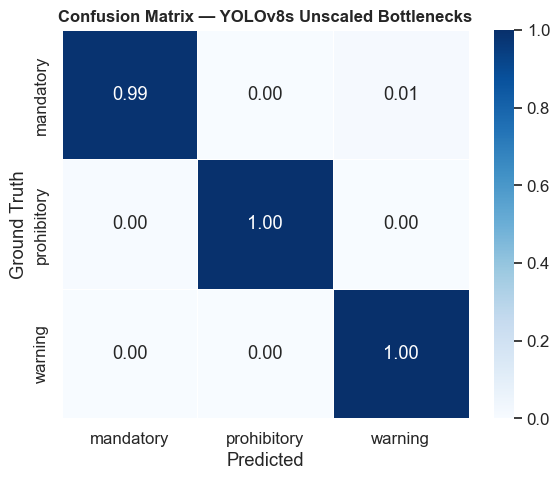

In [40]:
# ── Confusion Matrix (best model vs baseline) ───────────────────────────────
# Requires running inference and collecting per-image pred/gt pairs

def collect_pred_gt_pairs(run_name, imgs, iou_thresh=0.5):
    """Return flat lists of (gt_class, pred_class) matched pairs."""
    wt = RUNS_DIR / run_name / 'train' / 'weights' / 'best.pt'
    if not wt.exists():
        return [], []
    model = YOLO(str(wt))
    gt_list, pred_list = [], []
    for img_path in imgs:
        img = cv2.imread(img_path)
        h, w = img.shape[:2]
        stem = Path(img_path).stem
        lbl_path = VAL_LBL_DIR / f"{stem}.txt"
        gt_boxes = parse_gt_label(str(lbl_path), w, h)
        result = model(img, conf=CONF_THRES, iou=IOU_THRES,
                       imgsz=IMGSZ, verbose=False)[0]

        preds = []
        if result.boxes:
            for b in result.boxes:
                x1,y1,x2,y2 = map(int, b.xyxy[0].tolist())
                preds.append((int(b.cls), x1,y1,x2,y2))

        matched_gt = set()
        for pcls, px1,py1,px2,py2 in preds:
            best_iou, best_idx = 0, -1
            for gi,(gcls,gx1,gy1,gx2,gy2) in enumerate(gt_boxes):
                iou = box_iou_single((px1,py1,px2,py2),(gx1,gy1,gx2,gy2))
                if iou > best_iou:
                    best_iou, best_idx = iou, gi
            if best_iou >= iou_thresh and best_idx not in matched_gt:
                matched_gt.add(best_idx)
                gt_list.append(gt_boxes[best_idx][0])
                pred_list.append(pcls)
    return gt_list, pred_list


def plot_confusion_matrix(run_name, label, imgs):
    gt_cls, pr_cls = collect_pred_gt_pairs(run_name, imgs)
    if not gt_cls:
        print(f"  [skip] No matched pairs for {label}")
        return
    cm = confusion_matrix(gt_cls, pr_cls,
                           labels=list(range(NC)), normalize='true')
    fig, ax = plt.subplots(figsize=(max(6, NC), max(5, NC)))
    sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
                linewidths=0.5, ax=ax)
    ax.set_title(f'Confusion Matrix — {label}', fontweight='bold', fontsize=12)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Ground Truth')
    plt.tight_layout()
    safe = label.replace(' ', '_').replace('+', 'plus')
    plt.savefig(f'{RESULT_PATH}/analysis_cm_{safe}.png', dpi=150, bbox_inches='tight')
    plt.show()

# Plot confusion matrices for baseline and best proposed model
RUNS_TO_CM = list(EXPERIMENTS.items())[:1] + list(EXPERIMENTS.items())[-1:]
for run, label in RUNS_TO_CM:
    print(f"  Confusion matrix: {label}...")
    plot_confusion_matrix(run, label, eval_imgs)

## 10. Box Size Distribution Analysis

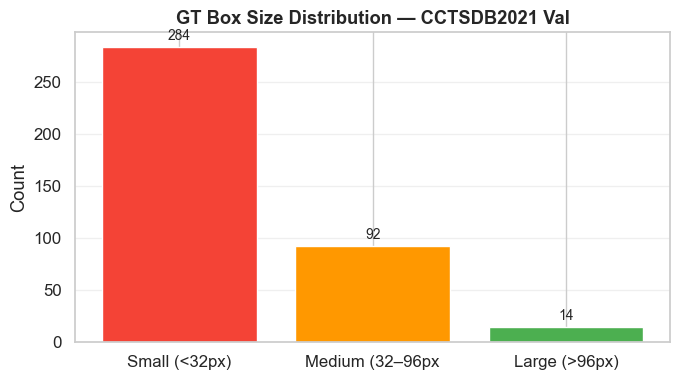

{'Small (<32px)': 284, 'Medium (32–96px': 92, 'Large (>96px)': 14}


In [41]:
# Analyze TP/FP/FN split by bounding box size category
# Helps show whether your backbone modification improves small-object recall

SIZE_BINS = [(0, 32, 'Small (<32px)'), (32, 96, 'Medium (32–96px'), (96, 9999, 'Large (>96px)')]

def get_box_size(coords):
    _, x1, y1, x2, y2 = coords
    return max(x2 - x1, y2 - y1)

def classify_size(size):
    for lo, hi, name in SIZE_BINS:
        if lo <= size < hi:
            return name
    return 'Large (>96px)'

size_stats = {}
for run, label in EXPERIMENTS.items():
    wt = RUNS_DIR / run / 'weights' / 'best.pt'
    if not wt.exists():
        continue
    model = YOLO(str(wt))
    bins = {name: {'TP': 0, 'FP': 0, 'FN': 0} for _, _, name in SIZE_BINS}

    for img_path in eval_imgs:
        img = cv2.imread(img_path)
        h, w = img.shape[:2]
        stem = Path(img_path).stem
        lbl_path = VAL_LBL_DIR / f"{stem}.txt"
        gt_boxes = parse_gt_label(str(lbl_path), w, h)
        result = model(img, conf=CONF_THRES, iou=IOU_THRES,
                       imgsz=IMGSZ, verbose=False)[0]
        counts = classify_predictions(result, gt_boxes)

        for gb in gt_boxes:
            sz = classify_size(get_box_size(gb))
        # Simplified: record FN per GT size
            bins[sz]['FN'] += 1  # start as FN, correct below
        bins_tp = counts['TP']
        # (For full per-size TP/FP, would need to pass size through classify_predictions)
        # This cell gives a GT distribution view; extend if needed

    size_stats[label] = bins

# Plot GT box size distribution across the val set
gt_size_counts = {'Small (<32px)': 0, 'Medium (32–96px': 0, 'Large (>96px)': 0}
for img_path in eval_imgs:
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    stem = Path(img_path).stem
    lbl_path = VAL_LBL_DIR / f"{stem}.txt"
    for gb in parse_gt_label(str(lbl_path), w, h):
        sz = classify_size(get_box_size(gb))
        gt_size_counts[sz] = gt_size_counts.get(sz, 0) + 1

fig, ax = plt.subplots(figsize=(7, 4))
bars = ax.bar(gt_size_counts.keys(), gt_size_counts.values(),
              color=['#F44336','#FF9800','#4CAF50'], edgecolor='white')
ax.bar_label(bars, padding=3, fontsize=10)
ax.set_title('GT Box Size Distribution — CCTSDB2021 Val', fontweight='bold')
ax.set_ylabel('Count')
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig(f'{RESULT_PATH}/analysis_gt_size_dist.png', dpi=150, bbox_inches='tight')
plt.show()
print(gt_size_counts)

## 11. Export Summary Report

In [42]:
# Merge all metrics into a single thesis-ready summary table
report_rows = []
for label in EXPERIMENTS.values():
    row = {'Model': label}
    if label in summary_df.index:
        for col in summary_df.columns:
            row[col] = summary_df.loc[label, col]
    if label in complex_df.index:
        for col in complex_df.columns:
            row[col] = complex_df.loc[label, col]
    if label in speed_df.index:
        for col in speed_df.columns:
            row[col] = speed_df.loc[label, col]
    if label in error_summary:
        e = error_summary[label]
        total_pred = e['TP'] + e['FP'] + e['CLS_ERR']
        total_gt   = e['TP'] + e['FN'] + e['CLS_ERR']
        row['TP'] = e['TP']
        row['FP'] = e['FP']
        row['FN'] = e['FN']
        row['CLS_ERR'] = e['CLS_ERR']
    report_rows.append(row)

report_df = pd.DataFrame(report_rows).set_index('Model')

# Save to CSV
report_df.to_csv(f'{RESULT_PATH}/analysis_summary_report.csv')
print("Saved: analysis_summary_report.csv")
print()
print(report_df.to_string())

Saved: analysis_summary_report.csv

                                                       mAP@0.5  mAP@0.5:0.95  Precision  Recall  Best Epoch  Params (M)  FLOPs (G)    FPS  Latency (ms)   TP   FP  FN  CLS_ERR
Model                                                                                                                                                                         
CSW-YOLO                                                0.8276        0.5316     0.8834  0.7751          99        8.70       29.7  114.9          8.70  334   57  51        5
ES-YOLO                                                 0.8211        0.5220     0.8831  0.7271          31        8.65       41.5   65.3         15.32  319   60  67        4
YOLOv8s                                                 0.8212        0.5270     0.9007  0.7619          96       11.14       28.7  154.4          6.48  326   44  62        2
YOLOv8s + Bi-FPN                                        0.8148        0.5208     0.8913  

In [43]:
# List all output files generated
output_files = sorted(glob.glob(f'{RESULT_PATH}/analysis_*.png') + glob.glob(f'{RESULT_PATH}/analysis_*.csv'))
print(f"Generated {len(output_files)} output files:")
for f in output_files:
    size_kb = os.path.getsize(f) // 1024
    print(f"  {f:50s}  {size_kb} KB")

Generated 26 output files:
  results\analysis_accuracy_complexity.png            94 KB
  results\analysis_accuracy_speed.png                 96 KB
  results\analysis_boxf1_curve_grid.png               1048 KB
  results\analysis_boxpr_curve_grid.png               865 KB
  results\analysis_cm_CSW-YOLO.png                    46 KB
  results\analysis_cm_ES-YOLO.png                     44 KB
  results\analysis_cm_YOLOv8s.png                     43 KB
  results\analysis_cm_YOLOv8s_Unscaled_Bottlenecks.png  48 KB
  results\analysis_cm_YOLOv8s_plus_Wise-Inner-MPDIoU.png  48 KB
  results\analysis_detection_grid.png                 2505 KB
  results\analysis_error_breakdown.png                201 KB
  results\analysis_fp_confidence_dist.png             110 KB
  results\analysis_gradcam_grid.png                   18412 KB
  results\analysis_gt_size_dist.png                   31 KB
  results\analysis_model_comparison.png               178 KB
  results\analysis_multilayer_gradcam.png             33